In [ ]:
import librosa
import librosa.display
import matplotlib.pyplot as plt
import numpy as np
from IPython.display import Audio
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.callbacks import EarlyStopping


# Loading .wav data

Step 1: Loading the train and test data using librose library.

Step 2: Calculate Short time Fourier Transform of the train and test data and the size of the stft is (513 × 2459)

In [ ]:
s, sr=librosa.load("/content/train_clean_male.wav", sr=None)
S=librosa.stft(s, n_fft=1024, hop_length=512)
sn, snr=librosa.load("/content/train_dirty_male.wav", sr=None)
X=librosa.stft(sn, n_fft=1024, hop_length=512)

In [ ]:
print('Clean Audio')
Audio(s,rate= sr)

Clean Audio


In [ ]:
print("Noisy Audio")
Audio(sn,rate= snr)

Noisy Audio


# Visualization of waveform and spectrum

Step 3: Find magnitudes |S| and |X|

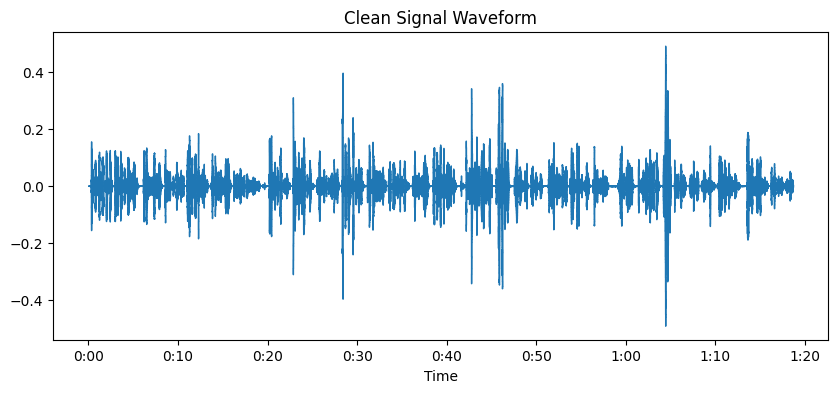

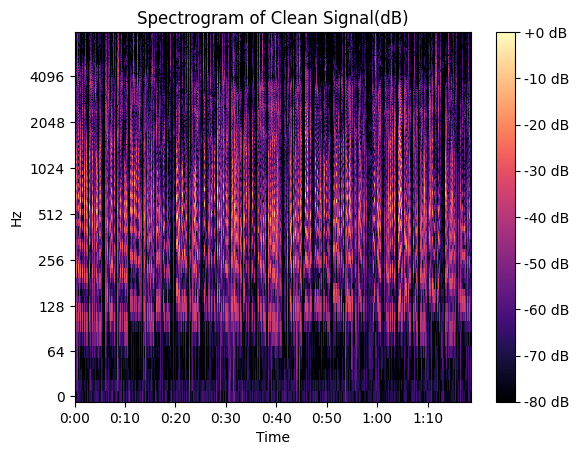

In [ ]:
plt.figure(figsize=(10, 4))
librosa.display.waveshow(s, sr=sr)
plt.title("Clean Signal Waveform")
plt.show()

S_mag = np.abs(S)
librosa.display.specshow(librosa.amplitude_to_db(S_mag, ref=np.max), sr=sr, x_axis='time', y_axis='log')
plt.colorbar(format='%+2.0f dB')
plt.title('Spectrogram of Clean Signal(dB)')
plt.show()

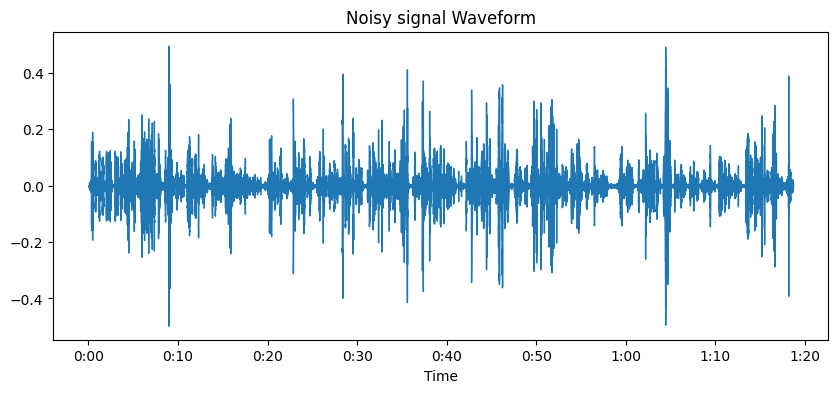

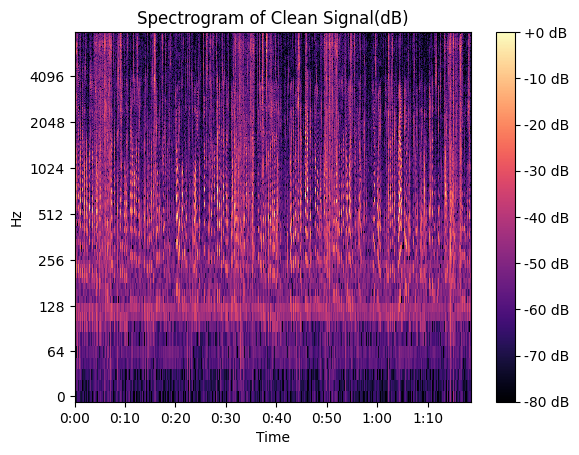

In [ ]:
plt.figure(figsize=(10, 4))
librosa.display.waveshow(sn, sr=sr)
plt.title("Noisy signal Waveform")
plt.show()

X_mag = np.abs(X)
librosa.display.specshow(librosa.amplitude_to_db(X_mag, ref=np.max), sr=sr, x_axis='time', y_axis='log')
plt.colorbar(format='%+2.0f dB')
plt.title('Spectrogram of Clean Signal(dB)')
plt.show()

Step 4: Train CNN Network

In [ ]:
input_dim = 513

model_cnn = models.Sequential([
    layers.Input(shape=(input_dim, 1)),

    layers.Conv1D(filters=16, kernel_size=9, strides=2, activation='relu'),

    layers.Conv1D(filters=32, kernel_size=7, strides=2, activation='relu'),

    layers.Conv1D(filters=64, kernel_size=5, strides=2, activation='relu'),

    layers.Flatten(),
    layers.Dense(513, activation='softplus')
])

model_cnn.compile(optimizer='adam', loss='mse', metrics=['mae'])
model_cnn.summary()


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv1d (Conv1D)                 │ (None, 253, 16)        │           160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_1 (Conv1D)               │ (None, 124, 32)        │         3,616 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_2 (Conv1D)               │ (None, 60, 64)         │        10,304 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 3840)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 513)            │     1,970,433 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,984,513 (7.57 MB)

 Trainable params: 1,984,513 (7.57 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:

X_train_cnn = X_mag.T
S_train = S_mag.T

early_stop = EarlyStopping(monitor='val_loss', patience=50, restore_best_weights=True, verbose=1)

history = model_cnn.fit(X_train_cnn, S_train,validation_split=0.2,batch_size=64,epochs=500,callbacks=[early_stop],verbose=1)

Epoch 1/500
31/31 ━━━━━━━━━━━━━━━━━━━━ 4s 83ms/step - loss: 0.3013 - mae: 0.4331 - val_loss: 0.0741 - val_mae: 0.0606
Epoch 2/500
31/31 ━━━━━━━━━━━━━━━━━━━━ 2s 76ms/step - loss: 0.0683 - mae: 0.0659 - val_loss: 0.0668 - val_mae: 0.0657
Epoch 3/500
31/31 ━━━━━━━━━━━━━━━━━━━━ 2s 57ms/step - loss: 0.0582 - mae: 0.0671 - val_loss: 0.0507 - val_mae: 0.0617
Epoch 4/500
31/31 ━━━━━━━━━━━━━━━━━━━━ 2s 58ms/step - loss: 0.0390 - mae: 0.0615 - val_loss: 0.0440 - val_mae: 0.0613
Epoch 5/500
31/31 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step - loss: 0.0359 - mae: 0.0624 - val_loss: 0.0403 - val_mae: 0.0581
Epoch 6/500
31/31 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.0298 - mae: 0.0575 - val_loss: 0.0379 - val_mae: 0.0571
Epoch 7/500
31/31 ━━━━━━━━━━━━━━━━━━━━ 5s 161ms/step - loss: 0.0264 - mae: 0.0560 - val_loss: 0.0369 - val_mae: 0.0553
Epoch 8/500
31/31 ━━━━━━━━━━━━━━━━━━━━ 4s 119ms/step - loss: 0.0249 - mae: 0.0547 - val_loss: 0.0346 - val_mae: 0.0552
Epoch 9/500
31/31 ━━━━━━━━━━━━━━━━━━━━ 3s 97ms/step - 

In [ ]:
S_pred = model_cnn.predict(X_train_cnn)
S_pred = S_pred.T

77/77 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step


Step 5: Convert STFT of predicted signal to signal again by performing inverse Fourier transform.


In [ ]:
# Use the phase of noisy signal
phase = np.angle(X)

# Reconstruct STFT
S_pred_stft = S_pred * np.exp(1j * phase)

# Inverse STFT
y_denoised = librosa.istft(S_pred_stft, hop_length=512)

# Listen to denoised audio
Audio(y_denoised, rate=sr)

In [ ]:
def compute_snr(clean, denoised):
    min_len = min(len(clean), len(denoised))
    clean_trimmed = clean[:min_len]
    denoised_trimmed = denoised[:min_len]

    snr = 10 * np.log10(np.sum(clean_trimmed**2) / np.sum((clean_trimmed - denoised_trimmed)**2))
    return snr

snr = compute_snr(sn, y_denoised)
print("SNR (dB):", snr)

SNR (dB): 7.894953


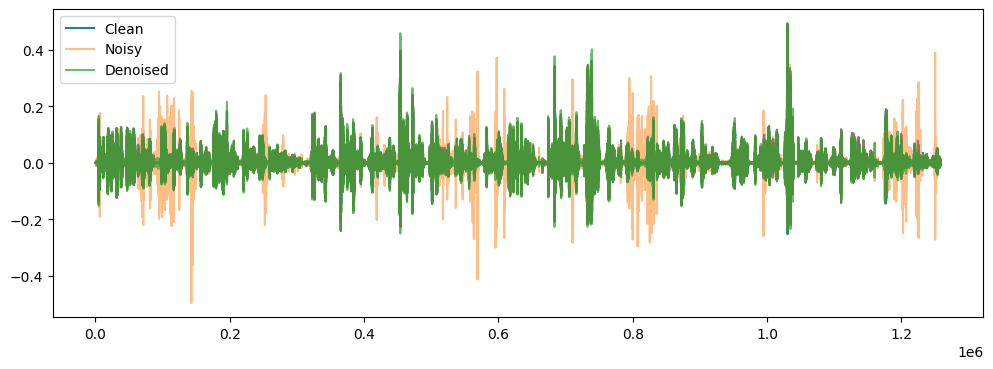

In [ ]:
plt.figure(figsize=(12,4))
plt.plot(s, label='Clean')
plt.plot(sn, alpha=0.5, label='Noisy')
plt.plot(y_denoised, alpha=0.7, label='Denoised')
plt.legend()
plt.show()

# Test Case _ 1

In [ ]:
test_file = "/content/test_x_01.wav"
y_test, sr = librosa.load(test_file, sr=None)
print(f"Test audio shape: {y_test.shape}, sample rate: {sr}")

n_fft = 1024
hop_length = 512

X_test = librosa.stft(y_test, n_fft=n_fft, hop_length=hop_length)
X_mag_test = np.abs(X_test)
X_phase_test = np.angle(X_test)

X_test_input = X_mag_test.T
print("Network input shape:", X_test_input.shape)

S_pred_test = model_cnn.predict(X_test_input)
S_pred_test = S_pred_test.T
print("Predicted magnitude shape:", S_pred_test.shape)

X_test_normalized = X_test / (X_mag_test + 1e-8)
S_hat_complex = X_test_normalized * S_pred_test

y_denoised_test = librosa.istft(S_hat_complex, hop_length=hop_length)

# Listen to denoised audio
Audio(y_denoised_test, rate=sr)

Test audio shape: (72619,), sample rate: 16000
Network input shape: (142, 513)
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Predicted magnitude shape: (513, 142)


In [ ]:
Audio(y_test, rate=sr)

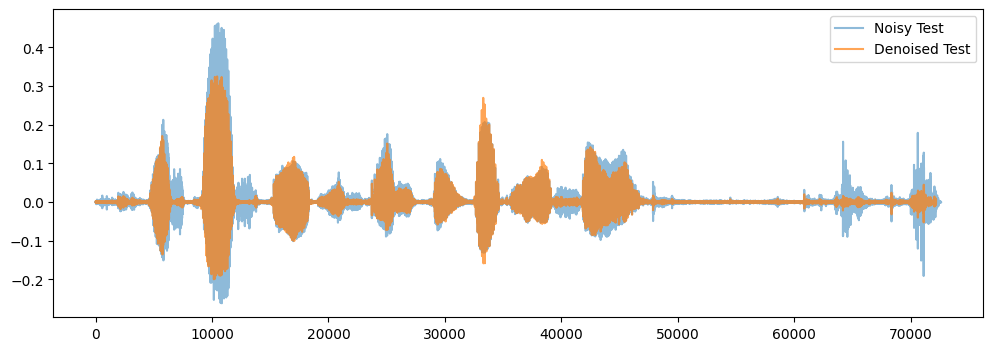

In [ ]:

plt.figure(figsize=(12,4))
plt.plot(y_test, alpha=0.5, label='Noisy Test')
plt.plot(y_denoised_test, alpha=0.7, label='Denoised Test')
plt.legend()
plt.show()

In [ ]:
snr = compute_snr(y_test, y_denoised_test)
print("SNR (dB):", snr)

SNR (dB): 8.698159


# Test case _ 2

In [ ]:
test_file = "/content/test_x_02.wav"
y_test, sr = librosa.load(test_file, sr=None)
print(f"Test audio shape: {y_test.shape}, sample rate: {sr}")

n_fft = 1024
hop_length = 512

X_test = librosa.stft(y_test, n_fft=n_fft, hop_length=hop_length)
X_mag_test = np.abs(X_test)
X_phase_test = np.angle(X_test)

X_test_input = X_mag_test.T
print("Network input shape:", X_test_input.shape)

S_pred_test = model_cnn.predict(X_test_input)
S_pred_test = S_pred_test.T
print("Predicted magnitude shape:", S_pred_test.shape)

X_test_normalized = X_test / (X_mag_test + 1e-8)
S_hat_complex = X_test_normalized * S_pred_test

y_denoised_test = librosa.istft(S_hat_complex, hop_length=hop_length)

# Listen to denoised audio
Audio(y_denoised_test, rate=sr)

Test audio shape: (194353,), sample rate: 16000
Network input shape: (380, 513)
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Predicted magnitude shape: (513, 380)


In [ ]:
Audio(y_test, rate=sr)

In [ ]:
snr = compute_snr(y_test, y_denoised_test)
print("SNR (dB):", snr)

SNR (dB): 8.031554


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

from google.colab import files

!jupyter nbconvert --to html "/content/drive/MyDrive/Colab Notebooks/DLS_HW2_2.ipynb"
files.download("/content/drive/MyDrive/Colab Notebooks/DLS_HW2_2.html")

Mounted at /content/drive
[NbConvertApp] Converting notebook /content/drive/MyDrive/Colab Notebooks/DLS_HW2_2.ipynb to html
[NbConvertApp] WARNING | Alternative text is missing on 6 image(s).
[NbConvertApp] Writing 2655458 bytes to /content/drive/MyDrive/Colab Notebooks/DLS_HW2_2.html


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>